# HUMAN ACTIVITY RECOGNITION

In [1]:
# IMPORTING THE REQUIRED PACKAGES
import pandas as pd
import numpy as np
import math
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
import xgboost as xgb

from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score,roc_auc_score,plot_roc_curve,roc_curve,auc,f1_score
from sklearn import tree
from sklearn.preprocessing import label_binarize
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

# READING THE DATA

In [2]:
df=pd.read_csv("/content/human.csv")
df.head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,1,STANDING
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,1,STANDING
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,1,STANDING
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,1,STANDING
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,1,STANDING


In [3]:
#checking the shape of the data
shape=df.shape
print("there are",shape[0],"records and",shape[1],"features")

there are 10299 records and 563 features


In [4]:
#viewing the features
df.columns

Index(['tBodyAcc-mean()-X', 'tBodyAcc-mean()-Y', 'tBodyAcc-mean()-Z',
       'tBodyAcc-std()-X', 'tBodyAcc-std()-Y', 'tBodyAcc-std()-Z',
       'tBodyAcc-mad()-X', 'tBodyAcc-mad()-Y', 'tBodyAcc-mad()-Z',
       'tBodyAcc-max()-X',
       ...
       'fBodyBodyGyroJerkMag-kurtosis()', 'angle(tBodyAccMean,gravity)',
       'angle(tBodyAccJerkMean),gravityMean)',
       'angle(tBodyGyroMean,gravityMean)',
       'angle(tBodyGyroJerkMean,gravityMean)', 'angle(X,gravityMean)',
       'angle(Y,gravityMean)', 'angle(Z,gravityMean)', 'subject', 'Activity'],
      dtype='object', length=563)

# DATA CLEANING

In [5]:
#checking for null values
if df.isnull().values.any()== False:
    print("NO NULL VALUES")
else:
    print("NULL VALUES ARE PRESENT")

NO NULL VALUES


In [6]:
#checking for duplicate values
if df.duplicated().values.any()==False:
    print("NO DUPLICATED FOUND") 
else:
    print("DUPLICATES ARE FOUND")

NO DUPLICATED FOUND


In [7]:
#viewing the statistical information of the dataset
df.describe()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject
count,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,...,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000,10299.000000
mean,0.274347,-0.017743,-0.108925,-0.607784,-0.510191,-0.613064,-0.633593,-0.525697,-0.614989,-0.466732,...,-0.298592,-0.617700,0.007705,0.002648,0.017683,-0.009219,-0.496522,0.063255,-0.054284,16.146422
std,0.067628,0.037128,0.053033,0.438694,0.500240,0.403657,0.413333,0.484201,0.399034,0.538707,...,0.320199,0.308796,0.336591,0.447364,0.616188,0.484770,0.511158,0.305468,0.268898,8.679067
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1.000000
25%,0.262625,-0.024902,-0.121019,-0.992360,-0.976990,-0.979137,-0.993293,-0.977017,-0.979064,-0.935788,...,-0.536174,-0.841847,-0.124694,-0.287031,-0.493108,-0.389041,-0.817288,0.002151,-0.131880,9.000000
50%,0.277174,-0.017162,-0.108596,-0.943030,-0.835032,-0.850773,-0.948244,-0.843670,-0.845068,-0.874825,...,-0.335160,-0.703402,0.008146,0.007668,0.017192,-0.007186,-0.715631,0.182028,-0.003882,17.000000
75%,0.288354,-0.010625,-0.097589,-0.250293,-0.057336,-0.278737,-0.302033,-0.087405,-0.288149,-0.014641,...,-0.113167,-0.487981,0.149005,0.291490,0.536137,0.365996,-0.521503,0.250790,0.102970,24.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,30.000000


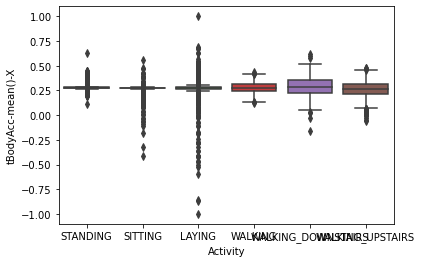

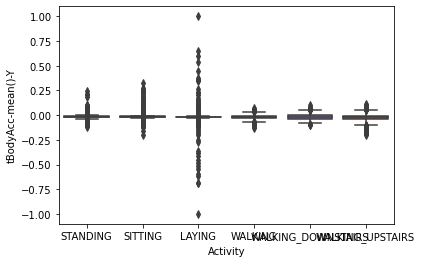

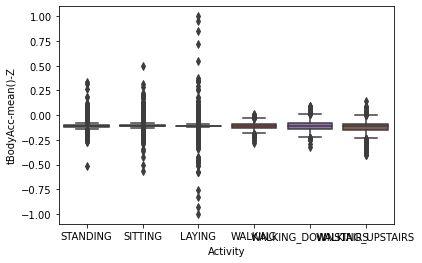

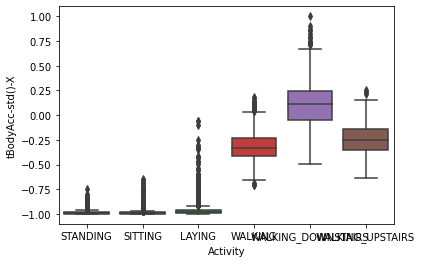

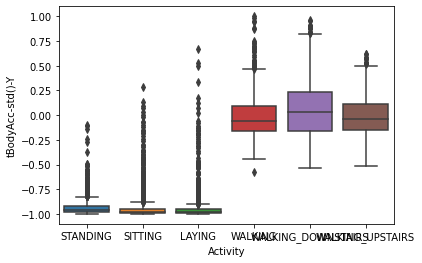

...

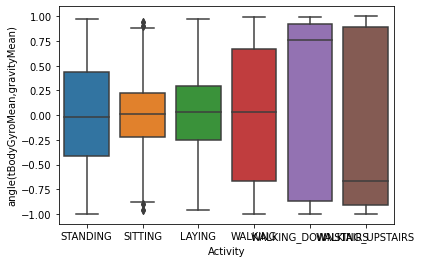

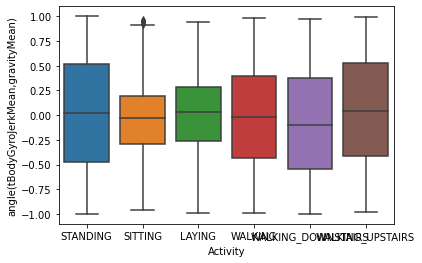

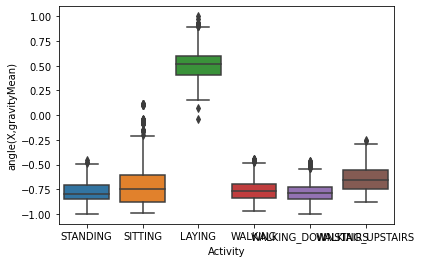

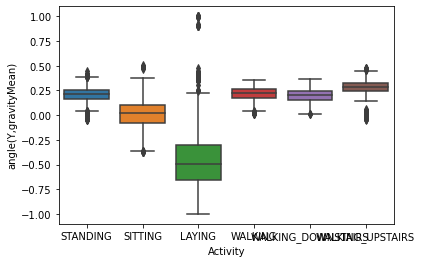

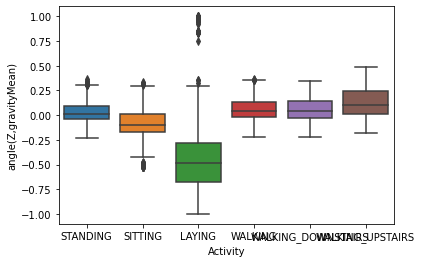

In [8]:
#checking for outliers using boxplot
plt.rcParams.update({'figure.max_open_warning': 0}) 
for col in df.columns[:561]:
    plt.figure()
    ax = sns.boxplot(x = 'Activity', y = col, data = df) 
    ax.plot()

we can find many outliers from the data, but outlier wont be a big problem here.

In [9]:
#checking for correct data types
types=df.drop(columns="Activity").dtypes
for i in types:
    if i=="object":
        print("found an object datatype")

# DATA VISUALISATION

In [10]:
#viewing the different classes in the data set
df["Activity"].value_counts()

LAYING                1944
STANDING              1906
SITTING               1777
WALKING               1722
WALKING_UPSTAIRS      1544
WALKING_DOWNSTAIRS    1406
Name: Activity, dtype: int64

[Text(0.5, 1.0, 'count of all classes')]

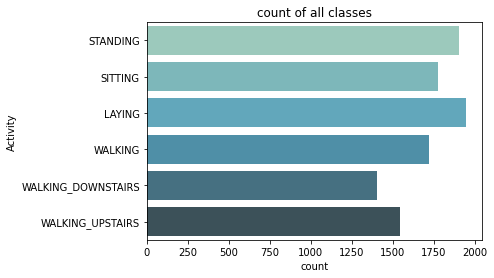

In [11]:
# #visualising the calsses
sns.countplot(y=df["Activity"],palette="GnBu_d").set(title="count of all classes")

by seeing the graph we can say that the data is not imbalanced, and the walking-downstairs have the lowest count comapred to other class.

In [12]:
#as this have many feature, we use dimensinality reduction to reduce the feature
#scaling the data
scalar=StandardScaler()
scaled_data=scalar.fit_transform(df.drop(columns=["Activity","subject"]))


In [13]:
#using principle component analysis to reduce the dimenality(features)
pca=PCA(n_components=2)
pca.fit(scaled_data)
pca_data=pca.transform(scaled_data)
pca_df=pd.DataFrame(pca_data,columns=["PC1","PC2"])
pca_df["Activity"]=df["Activity"]
pca_df

,PC1,PC2,Activity
0,-16.380980,1.995083,STANDING
1,-15.582173,1.182594,STANDING
2,-15.423989,2.243167,STANDING
3,-15.647807,3.762882,STANDING
4,-15.842320,4.438897,STANDING
...,...,...,...
10294,10.166057,-6.504223,WALKING_UPSTAIRS
10295,12.131154,-4.882446,WALKING_UPSTAIRS
10296,11.846853,-3.433565,WALKING_UPSTAIRS
10297,8.206686,-4.386489,WALKING_UPSTAIRS


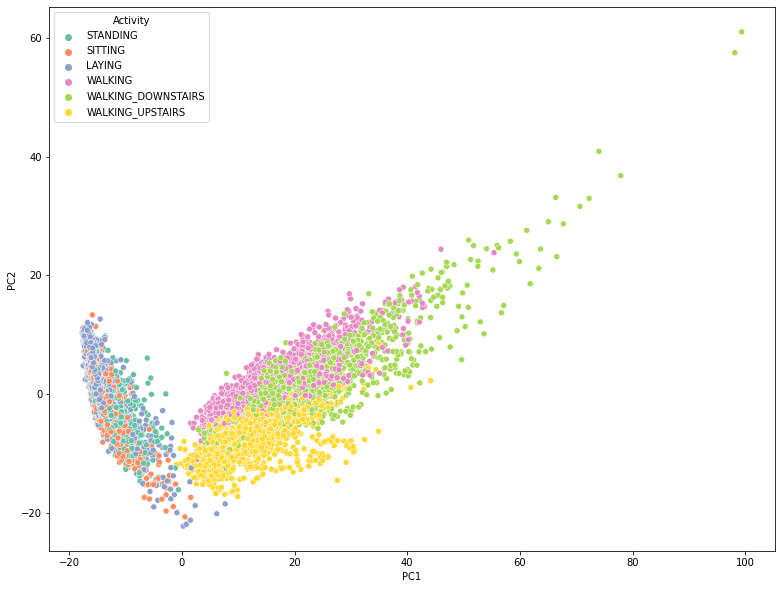

In [14]:
#visualising the distribution of the classes
plt.figure(figsize=(13,10))
sns.scatterplot(x="PC1",y="PC2",data=pca_df,hue=pca_df["Activity"],palette="Set2")

[Text(0.5, 1.0, 'data given by each user')]

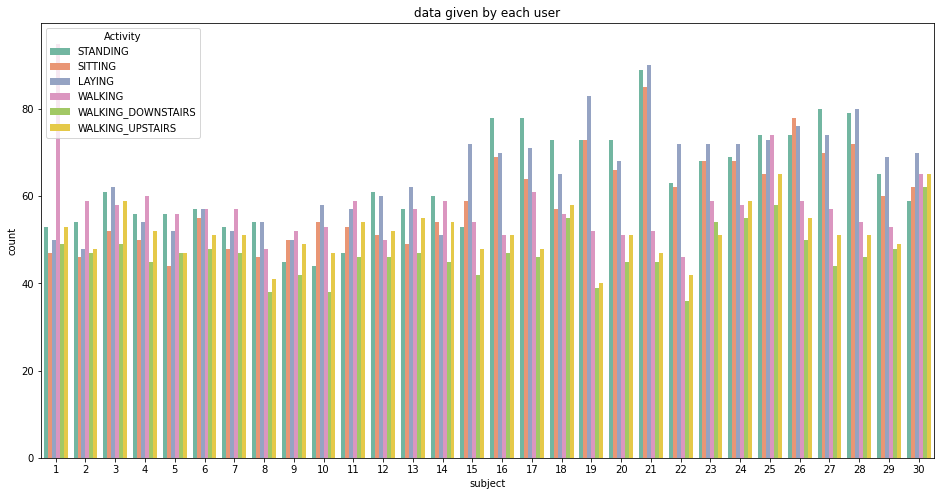

In [15]:
#plotting barplot to see how many data we got from each user
plt.figure(figsize=(16,8))
sns.countplot(x="subject",hue="Activity",data=df,palette="Set2").set(title="data given by each user")

by seeing the graph we can say, the person 21 gave the most data, and the person 1 gave more walking data compared to others.

# ENCODING THE TARGET

In [16]:
#encoding using label encoder
le=LabelEncoder()
df["Activity"]=le.fit_transform(df["Activity"])
le_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print(le_name_mapping)

{'LAYING': 0, 'SITTING': 1, 'STANDING': 2, 'WALKING': 3, 'WALKING_DOWNSTAIRS': 4, 'WALKING_UPSTAIRS': 5}


# FEATURE SELECTION

In [17]:
#Calculating correlation matrix
corr_matrix=df.corr()
corr_matrix

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
tBodyAcc-mean()-X,1.000000,0.128037,-0.230302,0.004590,-0.016785,-0.036071,0.010303,-0.017488,-0.038805,0.046943,...,-0.002255,-0.552989,0.015754,0.036047,0.034296,-0.041021,0.034053,0.030656,0.020345,0.009163
tBodyAcc-mean()-Y,0.128037,1.000000,-0.029882,-0.046352,-0.046996,-0.054153,-0.045247,-0.047673,-0.055524,-0.039445,...,-0.002842,0.077750,-0.027567,0.013241,0.077627,-0.007513,-0.005616,-0.016233,-0.001577,-0.063079
tBodyAcc-mean()-Z,-0.230302,-0.029882,1.000000,-0.024185,-0.023745,-0.015632,-0.022872,-0.022966,-0.009577,-0.040218,...,0.023122,0.055020,-0.042083,-0.066233,-0.030748,0.003215,-0.012986,-0.028406,0.001981,-0.061197
tBodyAcc-std()-X,0.004590,-0.046352,-0.024185,1.000000,0.922525,0.861910,0.998662,0.916087,0.856497,0.981226,...,0.135171,-0.034334,-0.017096,0.027464,-0.027123,-0.374104,0.449425,0.393063,-0.061397,0.816037
tBodyAcc-std()-Y,-0.016785,-0.046996,-0.023745,0.922525,1.000000,0.888259,0.918561,0.997510,0.887052,0.911137,...,0.191164,-0.020806,-0.006605,0.001902,-0.015784,-0.381391,0.506106,0.425511,-0.094486,0.820702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"angle(X,gravityMean)",-0.041021,-0.007513,0.003215,-0.374104,-0.381391,-0.353271,-0.371168,-0.378013,-0.355836,-0.384244,...,-0.081971,0.008050,0.017534,-0.007095,0.024822,1.000000,-0.748249,-0.635231,0.025003,-0.615424
"angle(Y,gravityMean)",0.034053,-0.005616,-0.012986,0.449425,0.506106,0.459092,0.444926,0.507947,0.460345,0.458832,...,0.078010,0.003082,-0.007256,-0.006444,-0.004582,-0.748249,1.000000,0.545614,-0.024190,0.692325
"angle(Z,gravityMean)",0.030656,-0.016233,-0.028406,0.393063,0.425511,0.483424,0.389481,0.424479,0.480032,0.402873,...,0.054008,-0.003242,-0.013130,-0.015380,-0.012549,-0.635231,0.545614,1.000000,-0.067160,0.605105
subject,0.020345,-0.001577,0.001981,-0.061397,-0.094486,-0.036750,-0.059112,-0.094315,-0.042434,-0.058773,...,-0.044378,-0.004619,0.008910,-0.018009,0.008301,0.025003,-0.024190,-0.067160,1.000000,-0.047965


In [18]:
selected_columns=[]
for i in range(len(corr_matrix)):
    if corr_matrix.iloc[i][562]>=0.5 or corr_matrix.iloc[i][562]<=-0.5:
        selected_columns.append(corr_matrix.columns[i])
        
# print(selected_columns)
print("length of selected columns is:",len(selected_columns))

length of selected columns is: 332


In [19]:
new_df=df[selected_columns]
new_df.head()

,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,tBodyAcc-max()-Y,tBodyAcc-max()-Z,tBodyAcc-min()-X,...,fBodyBodyGyroJerkMag-mad(),fBodyBodyGyroJerkMag-max(),fBodyBodyGyroJerkMag-min(),fBodyBodyGyroJerkMag-sma(),fBodyBodyGyroJerkMag-iqr(),fBodyBodyGyroJerkMag-entropy(),"angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",Activity
0,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,-0.567378,-0.744413,0.852947,...,-0.989941,-0.992448,-0.991048,-0.991990,-0.990458,-0.871306,-0.841247,0.179941,-0.058627,2
1,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,-0.557851,-0.818409,0.849308,...,-0.995442,-0.996866,-0.994440,-0.995854,-0.994544,-1.000000,-0.844788,0.180289,-0.054317,2
2,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,-0.557851,-0.818409,0.843609,...,-0.994640,-0.996060,-0.995866,-0.995031,-0.993755,-1.000000,-0.848933,0.180637,-0.049118,2
3,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,-0.576159,-0.829711,0.843609,...,-0.995722,-0.995273,-0.995732,-0.995221,-0.995226,-0.955696,-0.848649,0.181935,-0.047663,2
4,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,-0.569174,-0.824705,0.849095,...,-0.995279,-0.995609,-0.997418,-0.995093,-0.995487,-1.000000,-0.847865,0.185151,-0.043892,2


# DATA SPLITTING

In [20]:
#splitting the data to x and y
x=new_df.drop(columns=["Activity"])
y=new_df["Activity"]

In [21]:
#spliting to train and test data
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=7,test_size=0.2)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(8239, 331)
(2060, 331)
(8239,)
(2060,)


# MODEL BUILDING

MULTINOMIAL MODEL (LOGISTIC REGRESSION)

In [22]:
log=LogisticRegression(multi_class="multinomial")
log.fit(x_train,y_train)

LogisticRegression(multi_class='multinomial')

In [23]:
#prediction of logistic regression
log_y_pred=log.predict(x_test)

In [24]:
#confusion matrix for logistic regression
con_max_log=confusion_matrix(y_test,log_y_pred)
print(con_max_log)

[[385   0   0   0   1   0]
 [  2 348  22   0   0   0]
 [  0  20 362   0   0   0]
 [  0   0   0 320   3   2]
 [  0   0   0   0 303   2]
 [  0   0   0   4   0 286]]


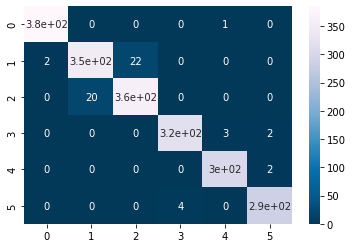

In [25]:
# visualising the confusion matrix
sns.heatmap(con_max_log,annot=True,cmap="PuBu_r");

In [26]:
#classification report for logistic regression
print(classification_report(y_test,log_y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       386
           1       0.95      0.94      0.94       372
           2       0.94      0.95      0.95       382
           3       0.99      0.98      0.99       325
           4       0.99      0.99      0.99       305
           5       0.99      0.99      0.99       290

    accuracy                           0.97      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.97      0.97      0.97      2060



K NEAREST NEIGHBHOR MODEL

In [27]:
knn=KNeighborsClassifier(n_neighbors=3)
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=3)

In [28]:
#choosing the best k value
iteration_knn=[]
aucroc_knn=[]
for i in range(3,21):
    knn_ht=KNeighborsClassifier(n_neighbors=i)
    knn_ht.fit(x_train,y_train)
    y_probha_knn_ht=knn_ht.predict_proba(x_test)
    aucroc=roc_auc_score(y_test,y_probha_knn_ht,multi_class="ovr")
    aucroc_knn.append(aucroc)
    iteration_knn.append(i)
knn_ht_vals=dict(zip(iteration_knn,aucroc_knn))
print(knn_ht_vals)

{3: 0.9977354067506615, 4: 0.9976272784177072, 5: 0.9975472398488447, 6: 0.9975705993253515, 7: 0.9977711457317465, 8: 0.9977998301874994, 9: 0.9983095378908393, 10: 0.9982359938886042, 11: 0.998521195255205, 12: 0.998614638100029, 13: 0.9985676609935469, 14: 0.9985669025195274, 15: 0.9985711690623055, 16: 0.9985378260803904, 17: 0.9985324140598276, 18: 0.9985159279280627, 19: 0.998527836748488, 20: 0.9985136249307248}


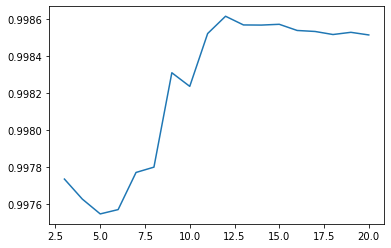

In [29]:
plt.plot(iteration_knn,aucroc_knn)

In [30]:
max_knnval=max(knn_ht_vals.values())
position=list(knn_ht_vals.values()).index(max_knnval)
ht_value=list(knn_ht_vals.keys())
print("The hyper tuned k value with high aucroc score is:",ht_value[position],"with the aucroc score:",max_knnval)

The hyper tuned k value with high aucroc score is: 12 with the aucroc score: 0.998614638100029


In [31]:
#fitting the knn model with the best k value 
knn=KNeighborsClassifier(n_neighbors=12)
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=12)

In [32]:
#prediction of knn model
knn_y_pred=knn.predict(x_test)

In [33]:
#confusion matrix for knn model
con_max_knn=confusion_matrix(y_test,knn_y_pred)
print(con_max_knn)

[[386   0   0   0   0   0]
 [  1 338  33   0   0   0]
 [  0  23 359   0   0   0]
 [  0   0   0 324   0   1]
 [  0   0   0   1 301   3]
 [  0   0   0   5   0 285]]


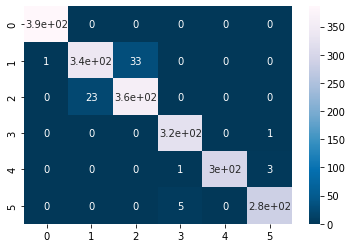

In [34]:
# visualising the confusion matrix
sns.heatmap(con_max_knn,annot=True,cmap="PuBu_r");

In [35]:
#classification report for knn model
print(classification_report(y_test,knn_y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       386
           1       0.94      0.91      0.92       372
           2       0.92      0.94      0.93       382
           3       0.98      1.00      0.99       325
           4       1.00      0.99      0.99       305
           5       0.99      0.98      0.98       290

    accuracy                           0.97      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.97      0.97      0.97      2060



DESCION TREE MODEL

In [36]:
dtree=DecisionTreeClassifier(max_depth=2)
dtree.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=2)

In [37]:
#finding the best hyper parameter(max_depth) 
iteration_dt=[]
aucroc_dt=[]
for i in range(3,21):
    dt_ht=DecisionTreeClassifier(max_depth=i)
    dt_ht.fit(x_train,y_train)
    y_probha_dt_ht=dt_ht.predict_proba(x_test)
    aucroc=roc_auc_score(y_test,y_probha_dt_ht,multi_class="ovr")
    aucroc_dt.append(aucroc)
    iteration_dt.append(i)
dt_ht_vals=dict(zip(iteration_dt,aucroc_dt))
print(dt_ht_vals)

{3: 0.9458285479632029, 4: 0.9715614732591978, 5: 0.981100861715762, 6: 0.9820400983825429, 7: 0.9839013414462023, 8: 0.9802153329793194, 9: 0.978005656939532, 10: 0.9698752236053344, 11: 0.9679174008473487, 12: 0.9610794180457708, 13: 0.9612388654955577, 14: 0.9622876782340639, 15: 0.959052591411666, 16: 0.9592651728969045, 17: 0.9598554937998988, 18: 0.9578288669092426, 19: 0.9597627767782217, 20: 0.9585119980478142}


In [38]:
max_dt_val=max(dt_ht_vals.values())
position=list(dt_ht_vals.values()).index(max_dt_val)
ht_value=list(dt_ht_vals.keys())
print("The hyper tuned k value with high aucroc score is:",ht_value[position],"with the aucroc score:",max_dt_val)

The hyper tuned k value with high aucroc score is: 7 with the aucroc score: 0.9839013414462023


In [39]:
#fiting the descion tree model wwith the best ma_depth value 20
dt=DecisionTreeClassifier(max_depth=7)
dt.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=7)

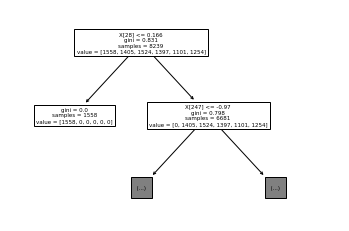

In [40]:
#visualising the tree
tree.plot_tree(dt,max_depth=1);

In [41]:
#prediction of descion tree model
dt_y_pred=dt.predict(x_test)

In [42]:
#confusion matrix for descion tree model
con_max_dt=confusion_matrix(y_test,dt_y_pred)
print(con_max_dt)

[[385   1   0   0   0   0]
 [  0 336  36   0   0   0]
 [  0  29 353   0   0   0]
 [  0   0   0 286   7  32]
 [  0   0   0  12 263  30]
 [  0   0   0  12  10 268]]


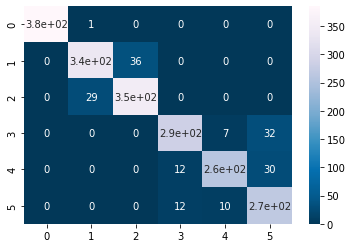

In [43]:
# visualising the confusion matrix
sns.heatmap(con_max_dt,annot=True,cmap="PuBu_r");

In [44]:
#classification report for descion tree model
print(classification_report(y_test,dt_y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       386
           1       0.92      0.90      0.91       372
           2       0.91      0.92      0.92       382
           3       0.92      0.88      0.90       325
           4       0.94      0.86      0.90       305
           5       0.81      0.92      0.86       290

    accuracy                           0.92      2060
   macro avg       0.92      0.92      0.91      2060
weighted avg       0.92      0.92      0.92      2060



RANDOM FOREST MODEL

In [45]:
# max_dept=log2(number of features)
dept=round(math.log2(len(x_train)))
rf=RandomForestClassifier(n_estimators=50,max_features="sqrt",max_depth=10)
rf.fit(x_train,y_train)

RandomForestClassifier(max_depth=10, max_features='sqrt', n_estimators=50)

In [46]:
#prediction of random forest model
rf_y_pred=rf.predict(x_test)

In [47]:
#confusion matrix for random forest model
con_max_rf=confusion_matrix(y_test,rf_y_pred)
print(con_max_rf)

[[386   0   0   0   0   0]
 [  0 355  17   0   0   0]
 [  0  19 363   0   0   0]
 [  0   0   0 315   7   3]
 [  0   0   0   2 294   9]
 [  0   0   0   3   1 286]]


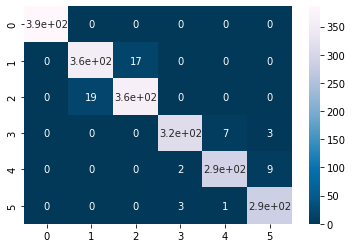

In [48]:
# visualising the confusion matrix
sns.heatmap(con_max_rf,annot=True,cmap="PuBu_r");

In [49]:
#classification report for random forest model
print(classification_report(y_test,rf_y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       386
           1       0.95      0.95      0.95       372
           2       0.96      0.95      0.95       382
           3       0.98      0.97      0.98       325
           4       0.97      0.96      0.97       305
           5       0.96      0.99      0.97       290

    accuracy                           0.97      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.97      0.97      0.97      2060



# performance metrics

ROC_AUC_SCORE OF EACH MODEL

In [50]:
#findig auc_roc scores for all the models and choosing the best

#predicting the probhability of the models
log_probha=log.predict_proba(x_test)
knn_probha=knn.predict_proba(x_test)
dt_probha=dt.predict_proba(x_test)
rf_probha=rf.predict_proba(x_test)

auc_roc_scores=[]
for i in [log_probha,knn_probha,dt_probha,rf_probha]:
    auc_roc=roc_auc_score(y_test,i,multi_class="ovr")
    auc_roc_scores.append(auc_roc)
 
model=["log_probha","knn_probha","dt_probha","rf_probha"]
for j in range(len(model)):
    print("The auc_roc score of ",model[j],"is ",auc_roc_scores[j])

The auc_roc score of  log_probha is  0.9991852171986538
The auc_roc score of  knn_probha is  0.998614638100029
The auc_roc score of  dt_probha is  0.9834164899414506
The auc_roc score of  rf_probha is  0.999126514670933


# MODEL EVALUATION


CHOOSING THE BEST MODEL

In [51]:
cross_score_log=cross_val_score(log,x_train,y_train,cv=10,scoring="roc_auc_ovr").mean()
cross_score_knn=cross_val_score(knn,x_train,y_train,cv=10,scoring="roc_auc_ovr").mean()
cross_score_dt=cross_val_score(dt,x_train,y_train,cv=10,scoring="roc_auc_ovr").mean()
cross_score_rf=cross_val_score(rf,x_train,y_train,cv=10,scoring="roc_auc_ovr").mean()

In [52]:
print("Cross value score of logistic regression model is:",cross_score_log)
print("Cross value score of knn model is:",cross_score_knn)
print("Cross value score of descion tree model is:",cross_score_dt)
print("Cross value score of random forest  model is:",cross_score_rf)

Cross value score of logistic regression model is: 0.9987316544355359
Cross value score of knn model is: 0.9975235132589825
Cross value score of descion tree model is: 0.9836336069228752
Cross value score of random forest  model is: 0.9989166258225743


In [53]:
#getting the maximum validation score
max_score=max([cross_score_log,cross_score_knn,cross_score_dt,cross_score_rf])
print("The maximum validation score out of all model is",max_score,"which belongs to RANDOM FOREST MODEL")

The maximum validation score out of all model is 0.9989166258225743 which belongs to RANDOM FOREST MODEL


TESTING THE MODEL

In [54]:
# max_dept=log2(number of features)
dept=round(math.log2(len(x_train)))
rf_model=RandomForestClassifier(n_estimators=50,max_features="sqrt",max_depth=10)
rf_model.fit(x_train,y_train)

RandomForestClassifier(max_depth=10, max_features='sqrt', n_estimators=50)

In [55]:
#prediction
y_pred=rf.predict(x_test)

In [56]:
#confusion matrix
con_max_rf=confusion_matrix(y_test,y_pred)
print(con_max_rf)

[[386   0   0   0   0   0]
 [  0 355  17   0   0   0]
 [  0  19 363   0   0   0]
 [  0   0   0 315   7   3]
 [  0   0   0   2 294   9]
 [  0   0   0   3   1 286]]


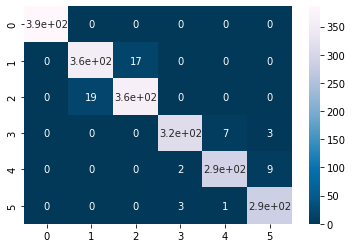

In [57]:
# visualising the confusion matrix
sns.heatmap(con_max_rf,annot=True,cmap="PuBu_r");

In [58]:
#classification report for random forest model
print(classification_report(y_test,rf_y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       386
           1       0.95      0.95      0.95       372
           2       0.96      0.95      0.95       382
           3       0.98      0.97      0.98       325
           4       0.97      0.96      0.97       305
           5       0.96      0.99      0.97       290

    accuracy                           0.97      2060
   macro avg       0.97      0.97      0.97      2060
weighted avg       0.97      0.97      0.97      2060

